In [1]:
import os
import gc
import sys

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline
sns.set_style('darkgrid')
pd.set_option('display.max_columns', 140)

In [2]:
# 1. Given Data 💽
# We are provided with 4 files

# example_sample_submission.csv
# features.csv
# example_test.csv
# train.csv
# train.csv is the main file which contains feature_0 to feature_129 for each trade
#which are market data which we will use for making prediction and 
#each trade has associated weight and resp which together represents a return on the trade.

# It also contain date column for day of trade.
# ts_id is for time ordering.

# It also has resp_1,2,3,4 for returns over different time horizons, but these are not present in test data.

# features.csv contains metadata of features.

# example_test shows how private test data will look like.

# example_sample_submission is example of how submission file should look like.

# We have to use api provided by kaggle to make the prediction.

In [3]:
# 2. Metrics 📐¶
# For each row in the test set we have to predict an action value 1 to make the trade and 0 to pass on it.

# each trade has associated weight and resp score which will be used to calculate 
#utility score which is the final score.

# For each i

# pi= ∑j(weightij∗respij∗actionij)

# t= ∑pi/∑p*2i √250|i|

# i is no of unique dates in test set.

# utitily = min(max(t,0),6)∑pi.

In [4]:
df = pd.read_csv('/Users/shuozhang/Desktop/jane-street-market-prediction/train.csv')

In [5]:
org_len = len(df)

In [6]:
df.shape

(2390491, 138)

In [7]:
df.head()

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,feature_80,feature_81,feature_82,feature_83,feature_84,feature_85,feature_86,feature_87,feature_88,feature_89,feature_90,feature_91,feature_92,feature_93,feature_94,feature_95,feature_96,feature_97,feature_98,feature_99,feature_100,feature_101,feature_102,feature_103,feature_104,feature_105,feature_106,feature_107,feature_108,feature_109,feature_110,feature_111,feature_112,feature_113,feature_114,feature_115,feature_116,feature_117,feature_118,feature_119,feature_120,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id
0,0,0.000000,0.009916,0.014079,0.008773,0.001390,0.006270,1,-1.872746,-2.191242,-0.474163,-0.323046,0.014688,-0.002484,NaN,NaN,-0.989982,-1.055090,NaN,NaN,-2.667671,-2.001475,-1.703595,-2.196892,NaN,NaN,1.483295,1.307466,NaN,NaN,1.175200,0.967805,1.608410,1.319365,NaN,NaN,-0.515073,-0.448988,NaN,NaN,-2.429812,-2.206423,-3.593120,-2.868358,0.112697,0.053157,-0.539956,-0.692187,3.491282,-1.684889,1.337123,-0.328607,1.689207,-1.052243,-1.870885,-1.789342,-1.574173,-1.120820,-0.571920,-1.093033,0.703515,5.936281,NaN,3.315812,1.291338,2.468825,2.490069,-1.148239,-0.961935,-2.263944,-2.158765,-5.012022,-2.006825,-1.284090,-2.141697,-2.054935,-1.851203,-1.431184,-1.634481,NaN,-0.373934,NaN,0.559241,0.891368,0.271700,NaN,-1.521125,NaN,3.045337,3.260512,0.683558,NaN,-0.109194,NaN,0.488806,1.447504,-2.790902,NaN,1.158770,NaN,3.754522,7.137163,-1.863069,NaN,0.434466,NaN,-0.292035,0.317003,-2.605820,NaN,2.896986,NaN,1.485813,4.147254,-2.238831,NaN,-0.892724,NaN,-0.156332,0.622816,-3.921523,NaN,2.561593,NaN,3.457757,6.649580,-1.472686,NaN,NaN,1.168391,8.313583,1.782433,14.018213,2.653056,12.600292,2.301488,11.445807,0
1,0,16.673515,-0.002828,-0.003226,-0.007319,-0.011114,-0.009792,-1,-1.349537,-1.704709,0.068058,0.028432,0.193794,0.138212,NaN,NaN,-0.151877,-0.384952,NaN,NaN,1.225838,0.789076,1.110580,1.102281,NaN,NaN,-0.590600,-0.625682,NaN,NaN,-0.543425,-0.547486,-0.706600,-0.667806,NaN,NaN,0.910558,0.914465,NaN,NaN,2.137454,2.080459,2.819291,2.483965,-0.086755,-0.082687,0.368431,0.469196,5.711996,-2.215132,0.796703,-1.140081,0.716617,-0.059431,-0.198920,-0.326697,-0.381770,1.435607,3.401393,2.486748,-2.014598,-0.390588,NaN,-0.027262,-1.886927,-1.706450,-0.888236,-1.138294,-0.954461,-1.350633,-1.459546,-4.564815,-2.651966,-1.620014,-2.240625,-2.147273,-0.255224,3.202946,-0.535872,NaN,-0.050948,NaN,0.141089,0.058363,0.131190,NaN,-0.121239,NaN,0.677553,0.045842,-0.124616,NaN,-0.007004,NaN,-0.410491,-0.024323,-3.012654,NaN,1.157671,NaN,1.297679,1.281956,-2.427595,NaN,0.024913,NaN,-0.413607,-0.073672,-2.434546,NaN,0.949879,NaN,0.724655,1.622137,-2.209020,NaN,-1.332492,NaN,-0.586619,-1.040491,-3.946097,NaN,0.983440,NaN,1.357907,1.612348,-1.664544,NaN,NaN,-1.178850,1.777472,-0.915458,2.831612,-1.417010,2.297459,-1.304614,1.898684,1
2,0,0.000000,0.025134,0.027607,0.033406,0.034380,0.023970,-1,0.812780,-0.256156,0.806463,0.400221,-0.614188,-0.354800,NaN,NaN,5.448261,2.668029,NaN,NaN,3.836342,2.183258,3.902698,3.045431,NaN,NaN,-1.141082,-0.979962,NaN,NaN,-1.157585,-0.966803,

In [8]:
# One might find this one thing mentioned in the data section confusing.

# "Trades with weight = 0 were intentionally included in the dataset for completeness, 
#although such trades will not contribute towards the scoring evaluation."

# As you can see there are many rows that has weight 0

# Do we have to remove those rows while training ? 🤷‍♀️

# Answer: Maybe we can use it while training because we are predicting resp value.
# but while calculating utility score for validation we should not use such value
# because as we see that in metrics pi is ∑j(weightij∗respij∗actionij) so 0 weight will not
# contribute in utility score.

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2390491 entries, 0 to 2390490
Columns: 138 entries, date to ts_id
dtypes: float64(135), int64(3)
memory usage: 2.5 GB


In [10]:
df.sort_values(by= ['date','ts_id'],inplace=True)

In [11]:
#Adding target
df['action'] = np.where(df['resp'] > 0,1,0)
df.action = df.action.astype('category')

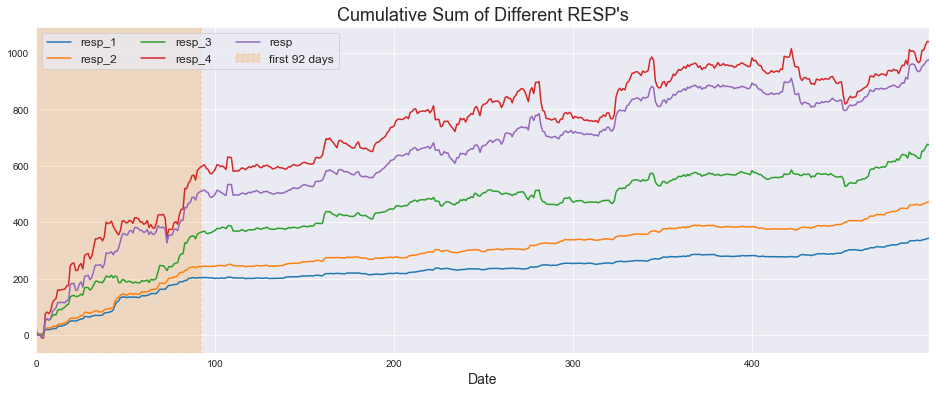

In [12]:
#Resp Data Analysis
fig = plt.figure(figsize=(16,6))
ax = plt.subplot(1,1,1)
df.groupby('date')[['resp_1', 'resp_2', 'resp_3', 'resp_4', 'resp']].sum().cumsum().plot(ax=ax)
plt.title('Cumulative Sum of Different RESP\'s',fontsize=18)
plt.xlabel('Date',fontsize=14)
plt.axvspan(0,92,linestyle=':',linewidth=2,label='first 92 days',color='darkorange',alpha=.2)
plt.legend(fontsize=12,ncol=3,loc=2);

In [13]:
#there were more gains in the first 92 days which leads to the insight mentioned 
#by many kaggler that it may be a good idea to drop the observations before this point

#resp_4 has the highest cumulative sum on the other hand resp_1 has the smallest cumulative sum

In [14]:
#plot the average of each Resp

In [15]:
fig = px.line(df.groupby('date')[['resp_1', 'resp_2', 'resp_3', 'resp_4','resp']].mean(),
              x= df.groupby('date')[['resp_1', 'resp_2', 'resp_3', 'resp_4','resp']].mean().index,
              y= ['resp_1', 'resp_2', 'resp_3', 'resp_4','resp'],
              title= '\naverage Resp per day')
fig.layout.xaxis.title = 'Day' 
fig.layout.yaxis.title = 'Avg Resp'
fig.show()

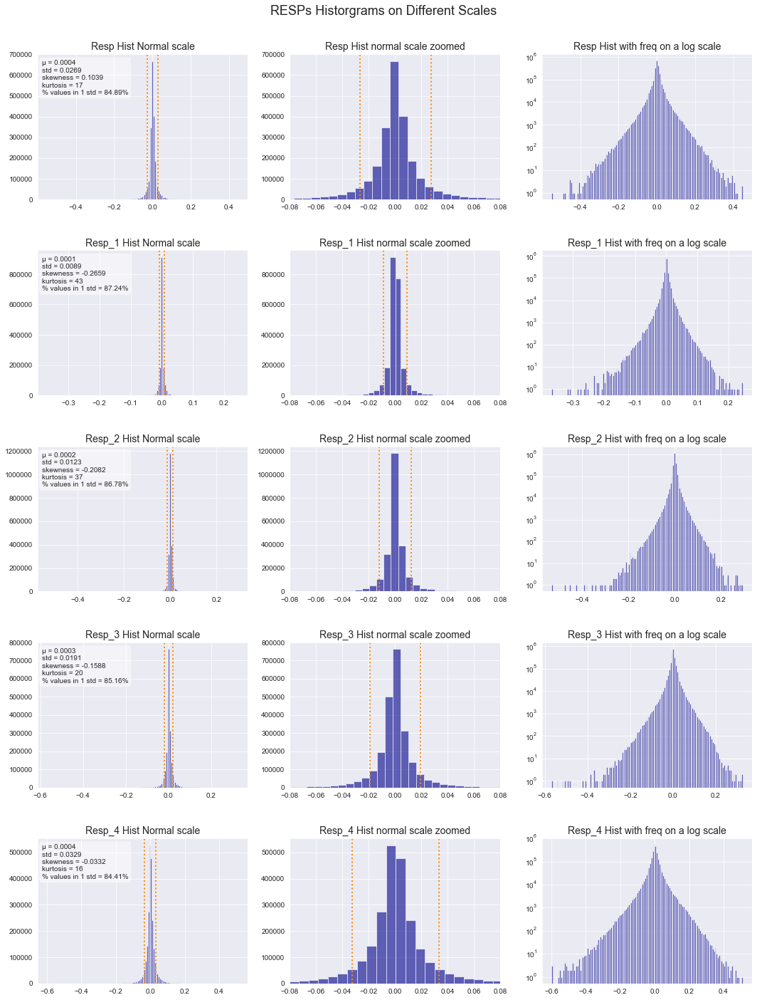

In [16]:
fig,((ax11,ax12,ax13),(ax21,ax22,ax23),(ax31,ax32,ax33),(ax41,ax42,ax43),(ax51,ax52,ax53)) = plt.subplots(5,3,figsize=(18,24))
plt.subplots_adjust(hspace=0.35)
ax11.hist(df.resp,bins=150, color='darkblue',alpha=.6)
ax11.axvline(df.resp.mean()+df.resp.std(),color='darkorange',linestyle=':',linewidth=2)
ax11.axvline(df.resp.mean()-df.resp.std(),color='darkorange',linestyle=':',linewidth=2)
df.resp.plot.hist(bins= 150,ax=ax12,color='darkblue',alpha=.6)
ax12.axvline(df.resp.mean()+df.resp.std(),color='darkorange',linestyle=':',linewidth=2)
ax12.axvline(df.resp.mean()-df.resp.std(),color='darkorange',linestyle=':',linewidth=2)
ax12.set_xlim(-.08,.08)
ax13.hist(df.resp,bins=150, color='darkblue',alpha=.6)
ax13.set_yscale('log')
skew= round(df.resp.skew(),4)
kurt= round(df.resp.kurtosis())
std1= round((((df.resp.mean()-df.resp.std()) < df.resp ) & (df.resp < (df.resp.mean()+df.resp.std()))).mean()*100,2)
props = dict(boxstyle='round', facecolor='white', alpha=0.5)
ax11.text(.02,.96,'μ = {}\nstd = {}\nskewness = {}\nkurtosis = {}\n% values in 1 std = {}%'.format(round(df.resp.mean(),4),round(df.resp.std(),4),skew,kurt,std1),
         transform=ax11.transAxes, verticalalignment='top',bbox=props,fontsize=10)
ax11.set_title('Resp Hist Normal scale',fontsize=14)
ax12.set_title('Resp Hist normal scale zoomed',fontsize=14)
ax13.set_title('Resp Hist with freq on a log scale',fontsize=14);
ax11.set_xlabel('')
ax11.set_ylabel('')
ax12.set_xlabel('')
ax12.set_ylabel('')
ax13.set_xlabel('')
ax13.set_ylabel('')
ax21.hist(df.resp_1,bins=150,color='darkblue',alpha=.6)
ax21.axvline(df.resp_1.mean()+df.resp_1.std(),color='darkorange',linestyle=':',linewidth=2)
ax21.axvline(df.resp_1.mean()-df.resp_1.std(),color='darkorange',linestyle=':',linewidth=2)
df.resp_1.plot.hist(bins= 150,ax=ax22,color='darkblue',alpha=.6)
ax22.axvline(df.resp_1.mean()+df.resp_1.std(),color='darkorange',linestyle=':',linewidth=2)
ax22.axvline(df.resp_1.mean()-df.resp_1.std(),color='darkorange',linestyle=':',linewidth=2)
ax22.set_xlim(-.08,.08)
ax23.hist(df.resp_1,bins=150,color='darkblue',alpha=.6)
ax23.set_yscale('log')
skew= round(df.resp_1.skew(),4)
kurt= round(df.resp_1.kurtosis())
std1= round((((df.resp_1.mean()-df.resp_1.std()) < df.resp_1 ) & (df.resp_1 < (df.resp_1.mean()+df.resp_1.std()))).mean()*100,2)
ax21.text(.02,.96,'μ = {}\nstd = {}\nskewness = {}\nkurtosis = {}\n% values in 1 std = {}%'.format(round(df.resp_1.mean(),4),round(df.resp_1.std(),4),skew,kurt,std1),
         transform=ax21.transAxes, verticalalignment='top',bbox=props,fontsize=10)
ax21.set_title('Resp_1 Hist Normal scale',fontsize=14)
ax22.set_title('Resp_1 Hist normal scale zoomed',fontsize=14)
ax23.set_title('Resp_1 Hist with freq on a log scale',fontsize=14);
ax21.set_xlabel('')
ax21.set_ylabel('')
ax22.set_xlabel('')
ax22.set_ylabel('')
ax23.set_xlabel('')
ax23.set_ylabel('')
ax31.hist(df.resp_2,bins=150,color='darkblue',alpha=.6)
ax31.axvline(df.resp_2.mean()+df.resp_2.std(),color='darkorange',linestyle=':',linewidth=2)
ax31.axvline(df.resp_2.mean()-df.resp_2.std(),color='darkorange',linestyle=':',linewidth=2)
df.resp_2.plot.hist(bins= 150,ax=ax32,color='darkblue',alpha=.6)
ax32.axvline(df.resp_2.mean()+df.resp_2.std(),color='darkorange',linestyle=':',linewidth=2)
ax32.axvline(df.resp_2.mean()-df.resp_2.std(),color='darkorange',linestyle=':',linewidth=2)
ax32.set_xlim(-.08,.08)
ax33.hist(df.resp_2,bins=150, color='darkblue',alpha=.6)
ax33.set_yscale('log')
skew= round(df.resp_2.skew(),4)
kurt= round(df.resp_2.kurtosis())
std1= round((((df.resp_2.mean()-df.resp_2.std()) < df.resp_2 ) & (df.resp_2 < (df.resp_2.mean()+df.resp_2.std()))).mean()*100,2)
ax31.text(.02,.96,'μ = {}\nstd = {}\nskewness = {}\nkurtosis = {}\n% values in 1 std = {}%'.format(round(df.resp_2.mean(),4),round(df.resp_2.std(),4),skew,kurt,std1),
         transform=ax31.transAxes, verticalalignment='top',bbox=props,fontsize=10)
ax31.set_title('Resp_2 Hist Normal scale',fontsize=14)
ax32.set_title('Resp_2 Hist normal scale zoomed',fontsize=14)
ax33.set_title('Resp_2 Hist with freq on a log scale',fontsize=14);
ax31.set_xlabel('')
ax31.set_ylabel('')
ax32.set_xlabel('')
ax32.set_ylabel('')
ax33.set_xlabel('')
ax33.set_ylabel('')
ax41.hist(df.resp_3, color='darkblue',alpha=.6,bins=150)
ax41.axvline(df.resp_3.mean()+df.resp_3.std(),color='darkorange',linestyle=':',linewidth=2)
ax41.axvline(df.resp_3.mean()-df.resp_3.std(),color='darkorange',linestyle=':',linewidth=2)
df.resp_3.plot.hist(bins=150, color='darkblue',alpha=.6,ax=ax42)
ax42.axvline(df.resp_3.mean()+df.resp_3.std(),color='darkorange',linestyle=':',linewidth=2)
ax42.axvline(df.resp_3.mean()-df.resp_3.std(),color='darkorange',linestyle=':',linewidth=2)
ax42.set_xlim(-.08,.08)
ax43.hist(df.resp_3, color='darkblue',alpha=.6,bins=150)
ax43.set_yscale('log')
skew= round(df.resp_3.skew(),4)
kurt= round(df.resp_3.kurtosis())
std1= round((((df.resp_3.mean()-df.resp_3.std()) < df.resp_3 ) & (df.resp_3 < (df.resp_3.mean()+df.resp_3.std()))).mean()*100,2)
ax41.text(.02,.96,'μ = {}\nstd = {}\nskewness = {}\nkurtosis = {}\n% values in 1 std = {}%'.format(round(df.resp_3.mean(),4),round(df.resp_3.std(),4),skew,kurt,std1),
         transform=ax41.transAxes, verticalalignment='top',bbox=props,fontsize=10)
ax41.set_title('Resp_3 Hist Normal scale',fontsize=14)
ax42.set_title('Resp_3 Hist normal scale zoomed',fontsize=14)
ax43.set_title('Resp_3 Hist with freq on a log scale',fontsize=14);
ax41.set_xlabel('')
ax41.set_ylabel('')
ax42.set_xlabel('')
ax42.set_ylabel('')
ax43.set_xlabel('')
ax43.set_ylabel('')
ax51.hist(df.resp_4,bins=150, color='darkblue',alpha=.6)
ax51.axvline(df.resp_4.mean()+df.resp_4.std(),color='darkorange',linestyle=':',linewidth=2)
ax51.axvline(df.resp_4.mean()-df.resp_4.std(),color='darkorange',linestyle=':',linewidth=2)
df.resp_4.plot.hist(bins= 150,color='darkblue',alpha=.6,ax=ax52)
ax52.axvline(df.resp_4.mean()+df.resp_4.std(),color='darkorange',linestyle=':',linewidth=2)
ax52.axvline(df.resp_4.mean()-df.resp_4.std(),color='darkorange',linestyle=':',linewidth=2)
ax52.set_xlim(-.08,.08)
ax53.hist(df.resp_4,bins=150,color='darkblue',alpha=.6)
ax53.set_yscale('log')
skew= round(df.resp_4.skew(),4)
kurt= round(df.resp_4.kurtosis())
std1= round((((df.resp_4.mean()-df.resp_4.std()) < df.resp_4 ) & (df.resp_4 < (df.resp_4.mean()+df.resp_4.std()))).mean()*100,2)
ax51.text(.02,.96,'μ = {}\nstd = {}\nskewness = {}\nkurtosis = {}\n% values in 1 std = {}%'.format(round(df.resp_4.mean(),4),round(df.resp_4.std(),4),skew,kurt,std1),
         transform=ax51.transAxes, verticalalignment='top',bbox=props,fontsize=10)
ax51.set_title('Resp_4 Hist Normal scale',fontsize=14)
ax52.set_title('Resp_4 Hist normal scale zoomed',fontsize=14)
ax53.set_title('Resp_4 Hist with freq on a log scale',fontsize=14)
ax51.set_xlabel('')
ax51.set_ylabel('')
ax52.set_xlabel('')
ax52.set_ylabel('')
ax53.set_xlabel('')
ax53.set_ylabel('')
fig.suptitle('RESPs Historgrams on Different Scales',fontsize=18,y=.92);

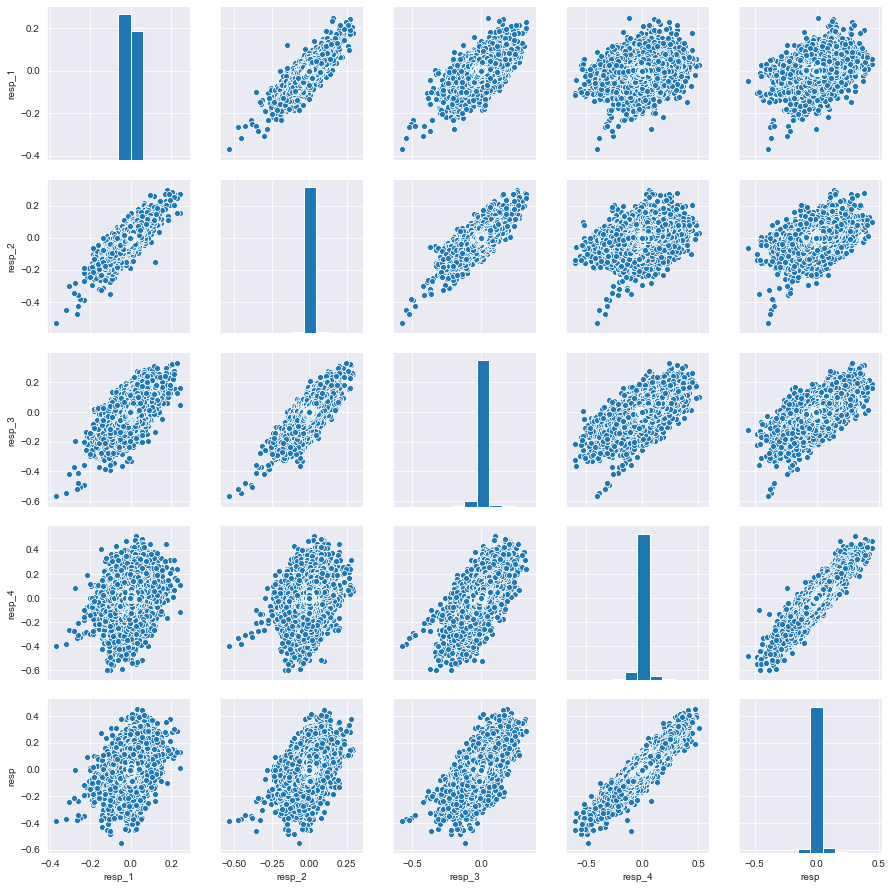

In [17]:
sns.pairplot(df[['resp_1', 'resp_2', 'resp_3', 'resp_4', 'resp']]);

In [18]:
 #Resp is highly related to Resp_4 also Resp_1 and Resp_2 are highly relted to each other
#from the relation shown in this figure and the standard deviation and distribution shown in the figure 
#before this one we can assume that Resp is more related to longer time horizon invest 
#as longer time horizon are associated with more return and higher risk

In [19]:
#Checking the unique values of date
df.date.unique()

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
       156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168,
       169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 18

In [20]:
#The Date seem to contain 2 years of trading data since the trading days of the year are approximately 252 : 253 days

In [21]:
fig = px.area(data_frame= df.groupby('date')[['resp']].sum(),title='Resp sum of operation per day')
fig.update_traces( showlegend = False)
fig.layout.xaxis.title = 'Day' 
fig.layout.yaxis.title = 'Resp sum'
fig.show()

In [22]:
#It can be noticed that Resp has many fluctuation¶

In [23]:
#We will create a moving standard deviation of 20 days (which is a month of trading) for the average of resp

In [24]:
date_df = df.groupby('date')[['resp']].mean()
std20 = []
for i in range(len(date_df)):
    if i <20:
        std20.append(np.nan)
    else:
        moving_std = date_df['resp'][i-20:i].std()
        std20.append(moving_std)
date_df['moving_std'] = std20
date_df.tail(2)

,resp,moving_std
date,,
498,0.001554,0.001962
499,0.000299,0.001969


In [25]:
fig = px.line(data_frame=date_df,y=['resp','moving_std'],title='Average Resp & 20 day moving standard deviation')
fig.layout.xaxis.title = 'Day' 
fig.layout.yaxis.title = 'Avg Resp'
fig.show()

In [26]:
#Now we check the standard deviation of each resp for each day

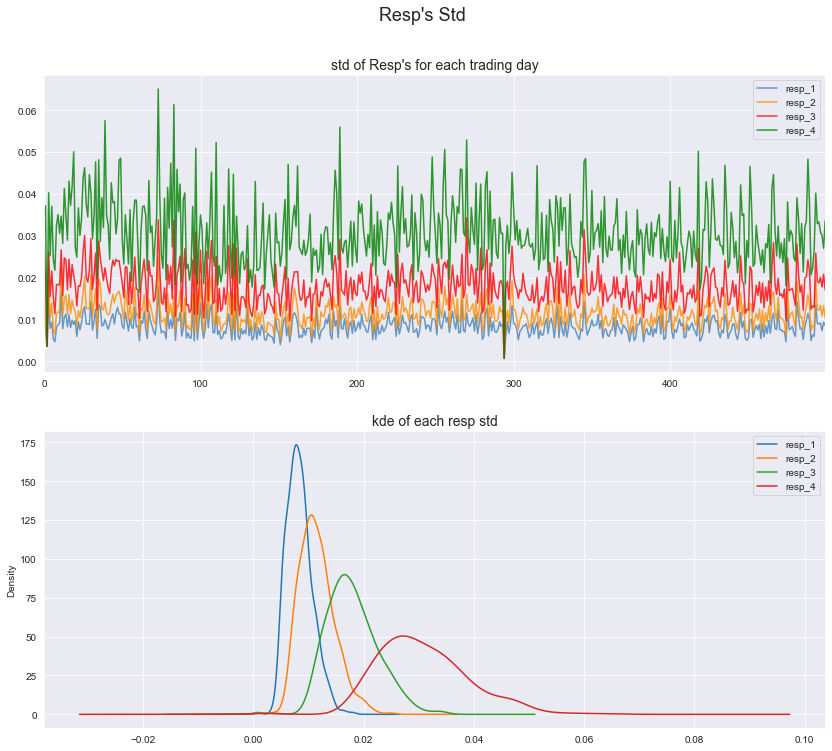

In [27]:
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(14,12))
df.groupby('date')[['resp_1', 'resp_2', 'resp_3', 'resp_4']].std().plot(ax=ax1,color=['steelblue','darkorange','red','green'],alpha=.8)
df.groupby('date')[['resp_1', 'resp_2', 'resp_3', 'resp_4']].std().plot.kde(ax=ax2)
fig.suptitle('Resp\'s Std',fontsize=18,y=.96)
ax2.set_xlabel('')
ax1.set_xlabel('')
ax2.set_title('kde of each resp std', fontsize=14)
ax1.set_title('std of Resp\'s for each trading day',fontsize=14);

In [28]:
#As it was mentioned before the standard deviation seems to increase with resp mostly 
#related to longer time horizon investments
#It can also be noticed that the deviation was kind of higher in the first 100 days 
#as it was mentioned by many kagglers that there may was some kind of trading model adjustment done 
#after the 80th day.¶

In [29]:
#Weight

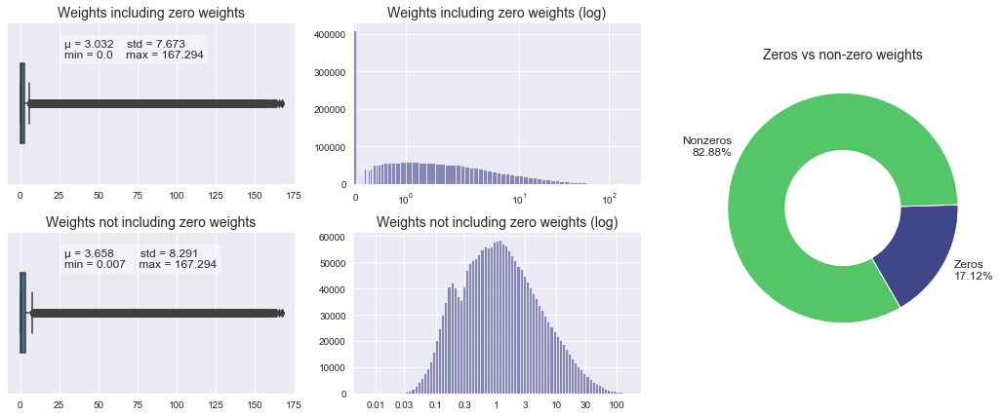

In [30]:
fig = plt.figure(figsize=(18,7))
grid =  gridspec.GridSpec(2,3,figure=fig,hspace=.3,wspace=.2)
ax1 = fig.add_subplot(grid[0, 0])
ax2 = fig.add_subplot(grid[0, 1])
ax3 = fig.add_subplot(grid[1, 0])
ax4 = fig.add_subplot(grid[1, 1])
ax5 = fig.add_subplot(grid[:, 2])
sns.boxplot(x = df.weight,width=.5,ax=ax1)
ax2.hist(df.weight, color='#404788ff',alpha=.6, bins= list([-.05] + list(10**np.arange(-2,2.24,.05))))
ax2.set_xscale('symlog')
ax2.set_xlim(-.05,227)
sns.boxplot(x = df.weight[df.weight != 0],width=.5,ax=ax3)
ax1.set_title('Weights including zero weights',fontsize=14)
ax3.set_title('Weights not including zero weights',fontsize=14)
ax2.set_title('Weights including zero weights (log)',fontsize=14)
ax4.set_title('Weights not including zero weights (log)',fontsize=14)
props = dict(boxstyle='round', facecolor='white', alpha=0.4)
ax1.text(.2,.9,'μ = {}    std = {}\nmin = {}    max = {}'.format(round(df.weight.mean(),3),round(df.weight.std(),3),round(df.weight.min(),3),round(df.weight.max(),3)),
         transform=ax1.transAxes, verticalalignment='top',bbox=props,fontsize=12)
ax3.text(.2,.9,'μ = {}        std = {}\nmin = {}    max = {}'.format(round(df.weight[df.weight != 0].mean(),3),round(df.weight[df.weight != 0].std(),3),
                                                              round(df.weight[df.weight != 0].min(),3),round(df.weight[df.weight != 0].max(),3)),
         transform=ax3.transAxes, verticalalignment='top',bbox=props,fontsize=12)
ax4.hist(df.weight[df.weight !=0],color='#404788ff',alpha=.6,bins=10**np.arange(-2.16,2.24,.05))
ax4.set_xscale('log')
ax4.set_xticks((.01,.03,.1,.3,1,3,10,30,100))
ax4.set_xticklabels((.01,.03,.1,.3,1,3,10,30,100))
ax5.pie(((df.weight==0).mean(),(1-(df.weight==0).mean())),startangle=300,wedgeprops=dict(width=0.5),
        labels=('Zeros\n{}%'.format(round((df.weight==0).mean()*100,2)),'Nonzeros\n{}%'.format(round((1-(df.weight==0).mean())*100,2))),
        textprops={'fontsize': 12},colors=['#404788ff','#55c667ff'])
ax5.set_title('Zeros vs non-zero weights',fontsize=14)
ax1.set_xlabel('')
ax2.set_xlabel('')
ax3.set_xlabel('')
ax2.set_ylabel('')
ax5.set_ylabel('')
ax4.set_xlabel('');

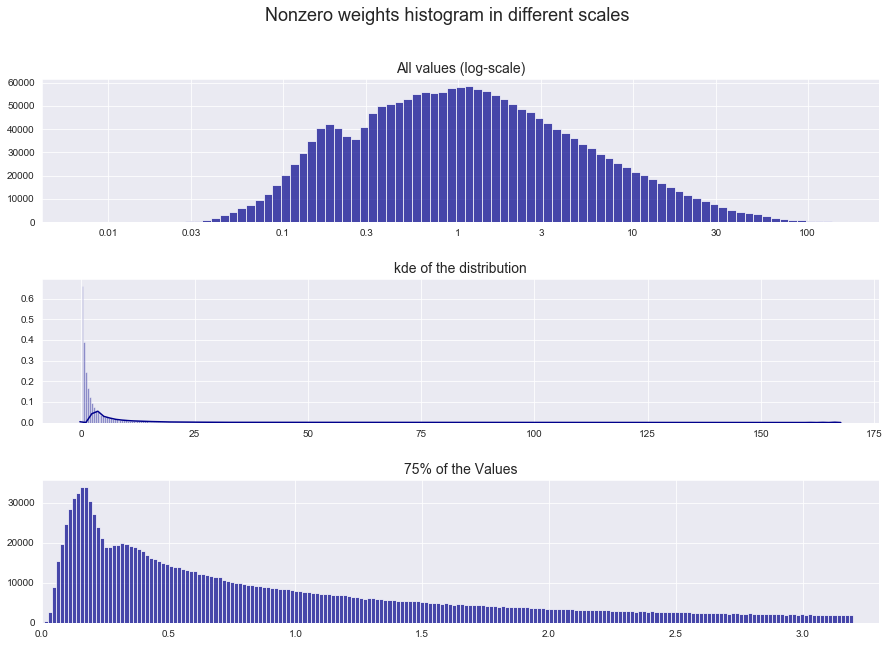

In [31]:
fig = plt.figure(figsize=(15,10))
fig.suptitle('Nonzero weights histogram in different scales',fontsize=18)
ax1 = plt.subplot(3,1,1)
ax1.hist(df.weight[df.weight !=0],color='darkblue',alpha=.7, bins=10**np.arange(-2.16,2.23,.05))
plt.xscale('log')
plt.xticks((.01,.03,.1,.3,1,3,10,30,100),(.01,.03,.1,.3,1,3,10,30,100))
ax2 = plt.subplot(3,1,2)
sns.distplot(df.weight[df.weight != 0], color='darkblue', bins=400, ax=ax2) 
ax3 = plt.subplot(3,1,3)
ax3.hist(df.weight[(df.weight !=0) & (df.weight < 3.197 )],color='darkblue',alpha=.7, bins=200)
ax3.set_xlim(0,3.3)
ax2.set_xlabel('') 
ax1.set_title('All values (log-scale)',fontsize=14)
ax2.set_title('kde of the distribution',fontsize=14)
ax3.set_title('75% of the Values',fontsize=14)
plt.subplots_adjust(hspace=.4);

/Users/shuozhang/anaconda3/lib/python3.7/site-packages/IPython/core/events.py:88: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.

/Users/shuozhang/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning:

Creating legend with loc="best" can be slow with large amounts of data.



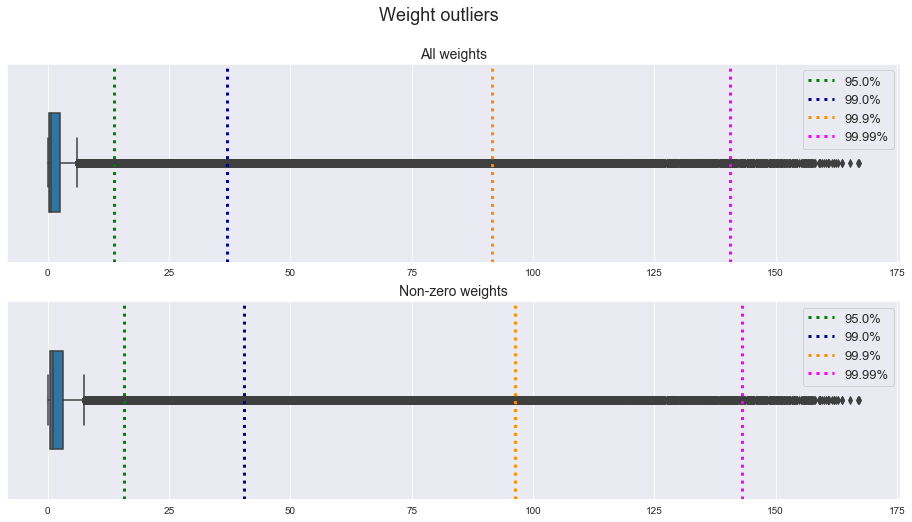

In [32]:
#A deeper look at outliers
fig, (ax1,ax2) = plt.subplots(2,1,figsize=(16,8))
fig.suptitle('Weight outliers',fontsize=18)
sns.boxplot(df.weight,width=.5, ax=ax1)
ax1.axvline(np.percentile(df.weight,95), color= 'green',label='95.0%',linestyle=':',linewidth=3)
ax1.axvline(np.percentile(df.weight,99), color= 'darkblue',label='99.0%',linestyle=':',linewidth=3)
ax1.axvline(np.percentile(df.weight,99.9), color= 'darkorange',label='99.9%',linestyle=':',linewidth=3)
ax1.axvline(np.percentile(df.weight,99.99), color= 'magenta',label='99.99%',linestyle=':',linewidth=3)
ax1.legend(fontsize=13)
sns.boxplot(df.weight[df.weight !=0],width=.5, ax=ax2)
ax2.axvline(np.percentile(df.weight[df.weight !=0],95), color= 'green',label='95.0%',linestyle=':',linewidth=3)
ax2.axvline(np.percentile(df.weight[df.weight !=0],99), color= 'darkblue',label='99.0%',linestyle=':',linewidth=3)
ax2.axvline(np.percentile(df.weight[df.weight !=0],99.9), color= 'darkorange',label='99.9%',linestyle=':',linewidth=3)
ax2.axvline(np.percentile(df.weight[df.weight !=0],99.99), color= 'magenta',label='99.99%',linestyle=':',linewidth=3)
ax2.legend(fontsize=13)
ax1.set_title('All weights', fontsize= 14)
ax2.set_title('Non-zero weights', fontsize= 14)
ax1.set_xlabel('')
ax2.set_xlabel('');

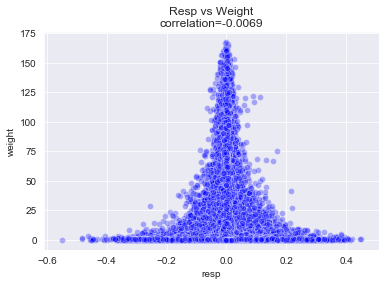

In [33]:
sns.scatterplot(data=df, x='resp',y='weight', color= 'blue', alpha=.3)
plt.title('Resp vs Weight\ncorrelation={}'.format(round(df.weight.corr(df.resp),4)));

In [34]:
#We can see that #weight is not linearly correlated with Resp but it's clear that higher weight are only associated with low Resp values

In [35]:
#Features data analysis

In [36]:
df_f = pd.read_csv('/Users/shuozhang/Desktop/jane-street-market-prediction/features.csv')

In [37]:
df_f.shape

(130, 30)

In [38]:
df_f.head()

,feature,tag_0,tag_1,tag_2,tag_3,tag_4,tag_5,tag_6,tag_7,tag_8,tag_9,tag_10,tag_11,tag_12,tag_13,tag_14,tag_15,tag_16,tag_17,tag_18,tag_19,tag_20,tag_21,tag_22,tag_23,tag_24,tag_25,tag_26,tag_27,tag_28
0,feature_0,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,feature_1,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,feature_2,False,False,False,False,False,False,True,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,feature_3,False,False,False,False,False,False,True,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,feature_4,False,False,False,False,False,False,True,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [39]:
df_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130 entries, 0 to 129
Data columns (total 30 columns):
feature    130 non-null object
tag_0      130 non-null bool
tag_1      130 non-null bool
tag_2      130 non-null bool
tag_3      130 non-null bool
tag_4      130 non-null bool
tag_5      130 non-null bool
tag_6      130 non-null bool
tag_7      130 non-null bool
tag_8      130 non-null bool
tag_9      130 non-null bool
tag_10     130 non-null bool
tag_11     130 non-null bool
tag_12     130 non-null bool
tag_13     130 non-null bool
tag_14     130 non-null bool
tag_15     130 non-null bool
tag_16     130 non-null bool
tag_17     130 non-null bool
tag_18     130 non-null bool
tag_19     130 non-null bool
tag_20     130 non-null bool
tag_21     130 non-null bool
tag_22     130 non-null bool
tag_23     130 non-null bool
tag_24     130 non-null bool
tag_25     130 non-null bool
tag_26     130 non-null bool
tag_27     130 non-null bool
tag_28     130 non-null bool
dtypes: bool(29), objec

In [40]:
fig = px.bar(df_f.set_index('feature').T.sum(), title='Number of tags for each feature')
fig.layout.xaxis.tickangle = 300
fig.update_traces( showlegend = False)
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.show()

In [41]:
#Exploring the missing values
fig = px.bar(x = df.isnull().sum().index,y= df.isnull().sum().values,title= 'Number of Null values')
fig.layout.xaxis.tickangle = 300
fig.layout.xaxis. dtick = 5
fig.layout.yaxis. dtick = 100000
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.layout.xaxis.showgrid = True
fig.show()

In [42]:
#Finding out the features with missing values more than 10 %¶
nulls = df.isnull().sum()
nulls_list = list(nulls[nulls >(0.1 * len(df))].index)
nulls_list

['feature_7',
 'feature_8',
 'feature_17',
 'feature_18',
 'feature_27',
 'feature_28',
 'feature_72',
 'feature_78',
 'feature_84',
 'feature_90',
 'feature_96',
 'feature_102',
 'feature_108',
 'feature_114']

In [43]:
#Looking into the relationship between these features since there is kind of pattern in the number of null values

In [44]:
df[['resp','resp_1','resp_2','resp_3','resp_4','weight']+nulls_list].corr().style.background_gradient(cmap='coolwarm')

,resp,resp_1,resp_2,resp_3,resp_4,weight,feature_7,feature_8,feature_17,feature_18,feature_27,feature_28,feature_72,feature_78,feature_84,feature_90,feature_96,feature_102,feature_108,feature_114
resp,1,0.452159,0.595274,0.815972,0.956197,-0.0069477,0.0212066,0.0146605,-0.0282765,-0.0174485,0.0482927,0.0325019,-0.00203429,7.2025e-05,0.0115004,0.00360387,0.013469,0.00461321,0.0132087,0.00438513
resp_1,0.452159,1,0.890214,0.678381,0.358949,-0.0160913,0.0339186,0.0261423,0.00433331,0.00663223,0.0361254,0.025671,-0.000889418,0.00137124,0.00833021,0.00197256,0.0104672,0.00299406,0.0102549,0.00296888
resp_2,0.595274,0.890214,1,0.823383,0.46923,-0.012955,0.0308002,0.0251238,-0.00581097,0.000201606,0.0398289,0.0286334,-0.00064214,0.00126619,0.00848688,0.00145437,0.0102474,0.00222318,0.0102697,0.00222515
resp_3,0.815972,0.678381,0.823383,1,0.805952,-0.00922915,0.0193167,0.0148591,-0.00207802,0.000566004,0.023373,0.0169505,-0.00449028,-0.00322108,0.00770419,0.000655175,0.0115417,0.00376563,0.0102313,0.0024377
resp_4,0.956197,0.358949,0.46923,0.805952,1,-0.00581651,0.0150588,0.00924589,-0.0188513,-0.0123064,0.033533,0.0223073,-0.00396501,-0.00223992,0.00991598,0.00308715,0.0129886,0.00535452,0.0119782,0.00444166
weight,-0.0069477,-0.0160913,-0.012955,-0.00922915,-0.00581651,1,-0.0161636,-0.000819016,-0.0115406,-0.00256817,-0.010643,0.00111826,0.00205782,0.000367295,-0.0415971,0.0524864,-0.0440574,0.0562611,-0.0461567,0.0538927
feature_7,0.0212066,0.0339186,0.0308002,0.0193167,0.0150588,-0.0161636,1,0.898832,0.402987,0.374951,0.487964,0.430844,-0.00971929,-0.00690267,-0.0153996,-0.0543594,-0.00908294,-0.0510832,-0.00172366,-0.04677
feature_8,0.0146605,0.0261423,0.0251238,0.0148591,0.00924589,-0.000819016,0.898832,1,0.373778,0.425576,0.424587,0.463257,-0.00391618,0.00118839,-0.00260382,-0.0386379,0.000781242,-0.0398018,0.0106087,-0.0342535
feature_17,-0.0282765,0.00433331,-0.00581097,-0.00207802,-0.0188513,-0.0115406,0.402987,0.373778,1,0.906956,-0.501928,-0.464884,-0.0702011,-0.0694315,-0.0213513,-0.053571,0.0391233,0.00781897,0.0168944,-0.02079
feature_18,-0.0174485,0.00663223,0.000201606,0.000566004,-0.0123064,-0.00256817,0.374951,0.425576,0.906956,1,-0.446295,-0.503707,-0.0786154,-0.0746344,-0.0216824,-0.0548213,0.040938,0.00621154,0.0175792,-0.0230747


In [45]:
#Since the number of null values in these columns are huge (larger than one quarter of a million!) 
#we will be dropping features with more than 10% null values 
#since there is no correlation with any of these features and Resp's and weight

In [46]:
df.drop(columns=nulls_list,inplace=True)

In [47]:
#now concerning the remaining nulls we will look firstly to the coefficient of variation¶

In [48]:
(df.iloc[:,7:-2].std() / df.iloc[:,7:-2].mean()).head(5)

feature_0    101.635945
feature_1      6.637764
feature_2      6.925977
feature_3    217.434315
feature_4    421.949150
dtype: float64

In [49]:
#the coefficient of variation seems unreliable due to the value of the mean being near to zero

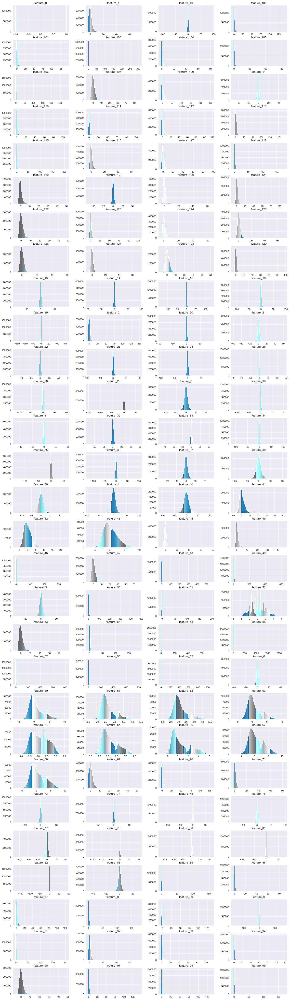

In [50]:
df.iloc[:,7:-2].hist(bins=100,figsize=(20,74),layout=(29,4));

In [61]:
featstr = [i for i in df.columns[7:-2]]
len(featstr)

116

In [51]:
#We can see that there is a lot of outliers affecting the distribution of each feature.
#Also since the majority of values are heavily centerd around the mean, we will fill null values using the mean.¶

In [55]:
df.iloc[:,7:-2].info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2390491 entries, 0 to 2390490
Columns: 116 entries, feature_0 to feature_129
dtypes: float64(115), int64(1)
memory usage: 2.1 GB


In [56]:
df.iloc[:,7:-2]=df.iloc[:,7:-2].fillna(df.iloc[:,7:-2].mean(axis=0))

In [57]:
df.isnull().sum()

date           0
weight         0
resp_1         0
resp_2         0
resp_3         0
resp_4         0
resp           0
feature_0      0
feature_1      0
feature_2      0
feature_3      0
feature_4      0
feature_5      0
feature_6      0
feature_9      0
feature_10     0
feature_11     0
feature_12     0
feature_13     0
feature_14     0
feature_15     0
feature_16     0
feature_19     0
feature_20     0
feature_21     0
feature_22     0
feature_23     0
feature_24     0
feature_25     0
feature_26     0
              ..
feature_99     0
feature_100    0
feature_101    0
feature_103    0
feature_104    0
feature_105    0
feature_106    0
feature_107    0
feature_109    0
feature_110    0
feature_111    0
feature_112    0
feature_113    0
feature_115    0
feature_116    0
feature_117    0
feature_118    0
feature_119    0
feature_120    0
feature_121    0
feature_122    0
feature_123    0
feature_124    0
feature_125    0
feature_126    0
feature_127    0
feature_128    0
feature_129   

In [58]:
#Features growth

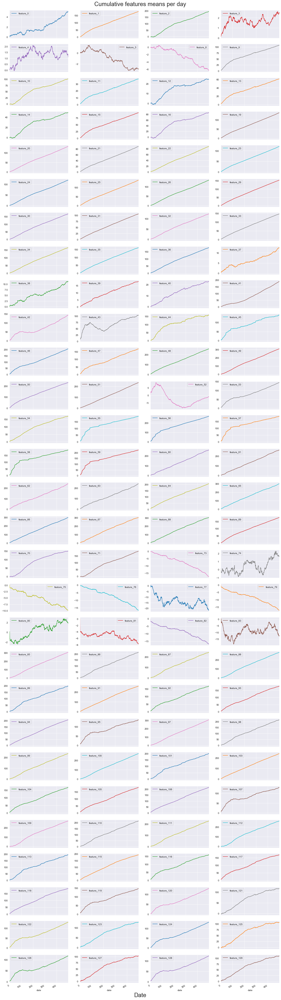

In [62]:
df.groupby('date')[featstr].mean().cumsum().plot(layout=(29,4),subplots=True,figsize=(20,82))
fig = plt.gcf()
fig.text(0.5, 0.19, 'Date',ha='center', fontsize = 24)
fig.suptitle('Cumulative features means per day',fontsize=24,y=.886);

In [63]:
#Many features cumulative mean seem to be linearly growing 
#but some features like 82 are actually decreasing, 
#and there are some features that fluctuate like feature 3¶

In [64]:
#Correlation between features

In [65]:
corr = df.iloc[:,7:-2].corr()
corr.style.background_gradient(cmap='coolwarm')

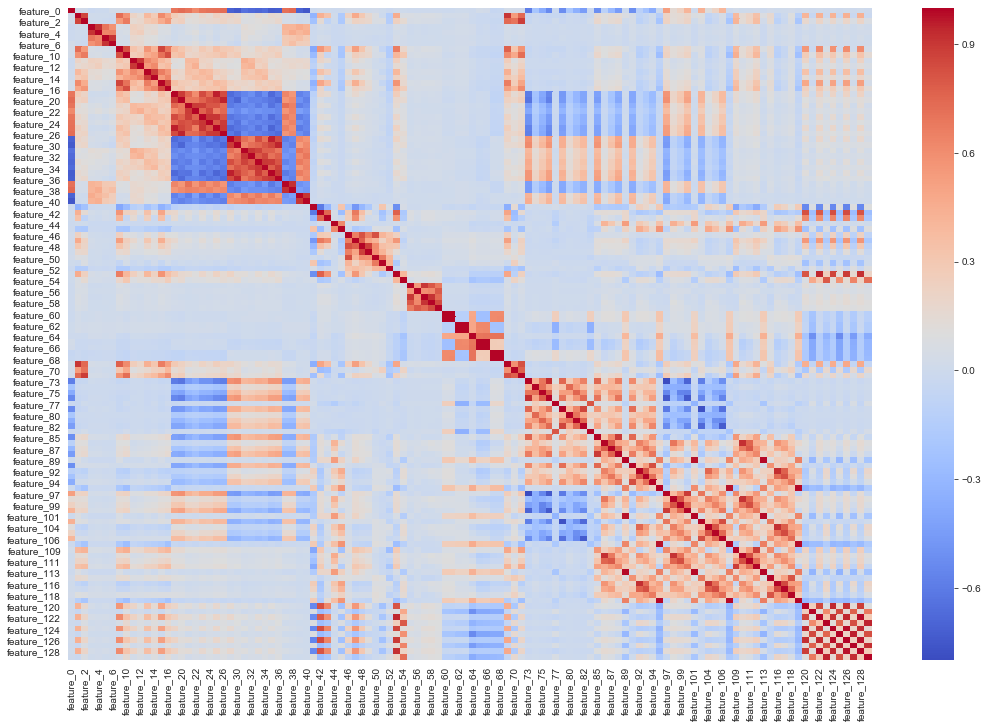

In [66]:
fig = plt.figure(figsize=(18,12))
ax = plt.subplot(1,1,1)
sns.heatmap(corr,ax= ax, cmap='coolwarm');

In [67]:
#It looks like there is a lot of multicollinearity between features 
#and also it looks like there is a pattern of couples in the features space 
#and this pattern is kind of broke at some features like feature_41

In [68]:
featstr2 = [ i for i in featstr if i not in ['feature_41','feature_64']]
print(len(featstr))
print(len(featstr2))

116
114


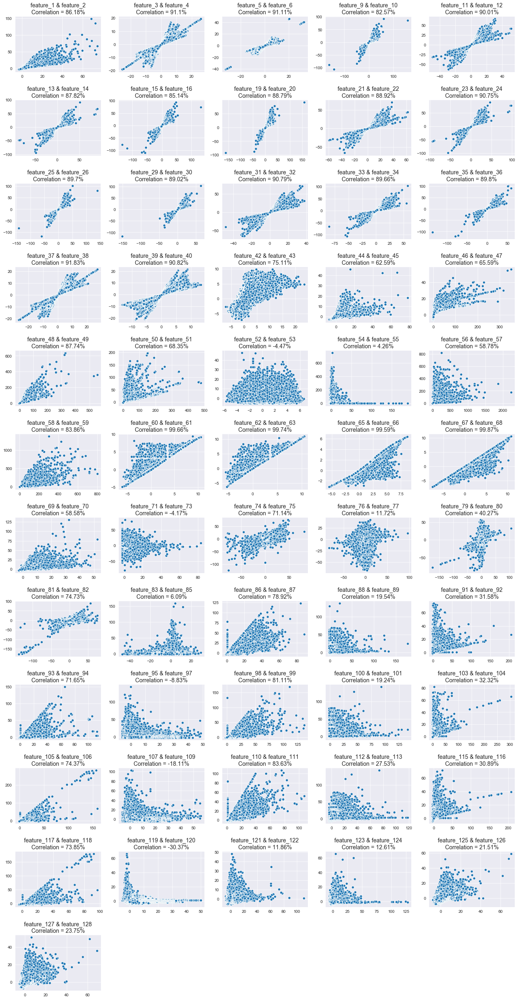

In [69]:
fig = plt.figure(figsize=(22,44))
grid =  gridspec.GridSpec(12,5,figure=fig,hspace=.5,wspace=.2)
counter = 1
for i in range(12):
    for j in range(5):
        if counter == 113:
            break
        subf = fig.add_subplot(grid[i, j]);
        sns.scatterplot(x= df[featstr2[counter]], y = df[featstr2[counter+1]], ax= subf);
        cor = round(df[featstr2[counter]].corr(df[featstr2[counter+1]]) * 100,2)
        subf.set_xlabel('')
        subf.set_ylabel('')
        subf.set_title('{} & {}\nCorrelation = {}%'.format(featstr2[counter],featstr2[counter+1],cor),fontsize=14)
        counter += 2
        gc.collect(); 

In [70]:
#As expected since these are finance related features a lot of features are highly correlate with each other

In [71]:
#Now we explore highly correlated groups of features

#We start off with featrues: [feature_19, feature_20, feature_21, feature_22, feature_23, feature_24,
#feature_25, feature_26, feature_29] since there is kind of multicollinearity cluster

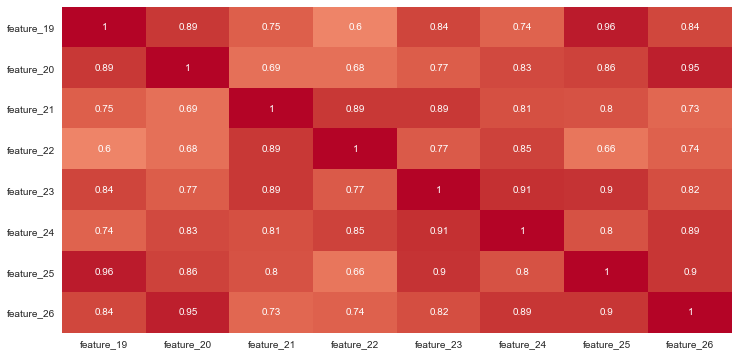

In [72]:
plt.figure(figsize=(12,6)) 
sns.heatmap(df[featstr2[15:23]].corr(),center=0,cmap='coolwarm',annot=True,cbar=False);

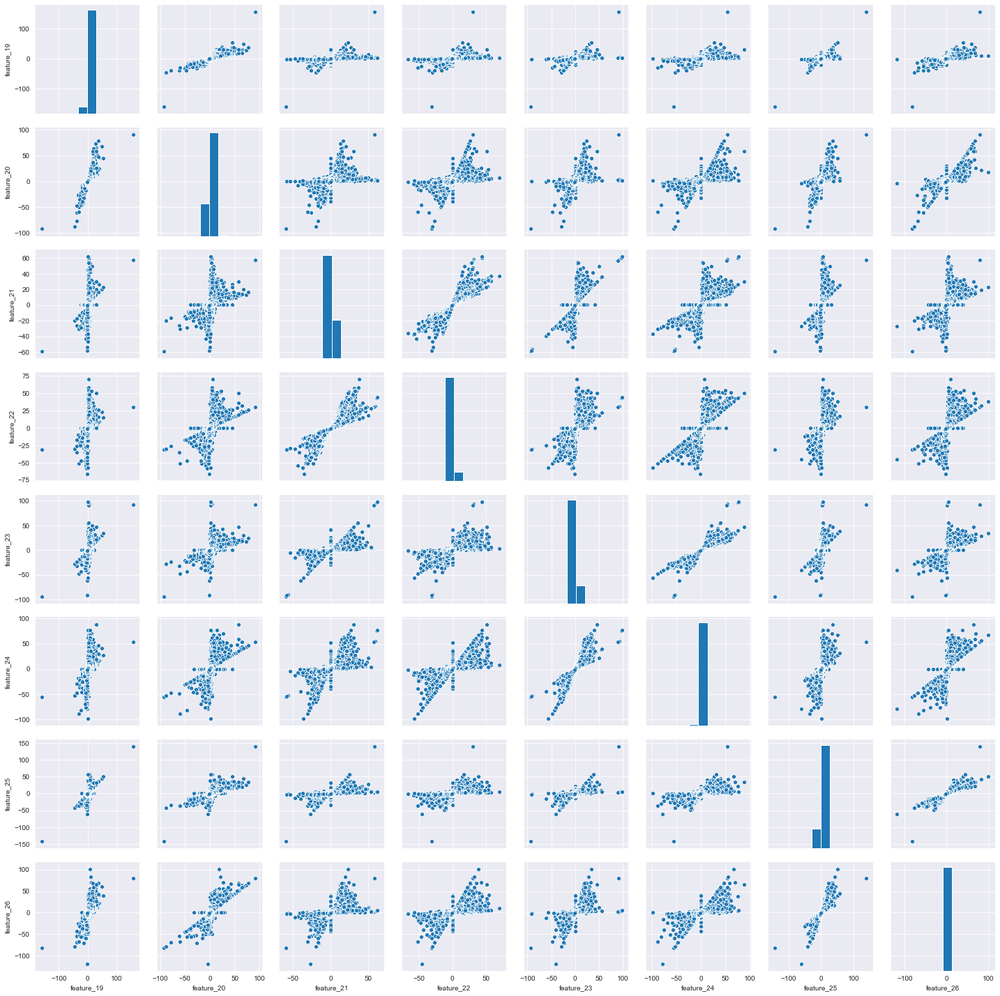

In [73]:
sns.pairplot(df[featstr2[15:23]]);

In [74]:
#Despite the fact that Pearson coefficients of correlation are really high between these features 
#the relationships are not completely linear,
#also it can be noticed that the outliers affect the shape of scatter plots.

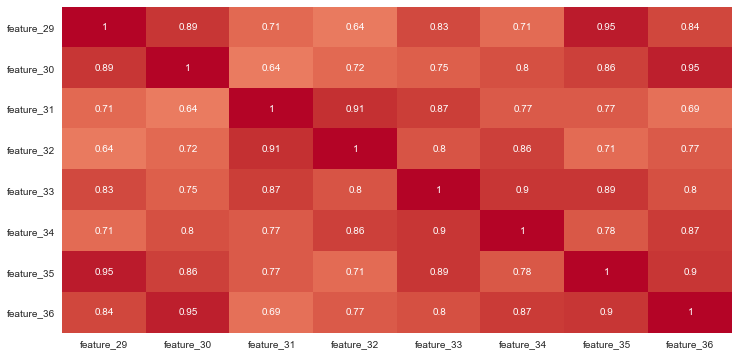

In [75]:
plt.figure(figsize=(12,6)) 
sns.heatmap(df[featstr2[23:31]].corr(),center=0,cmap='coolwarm',annot=True,cbar=False);

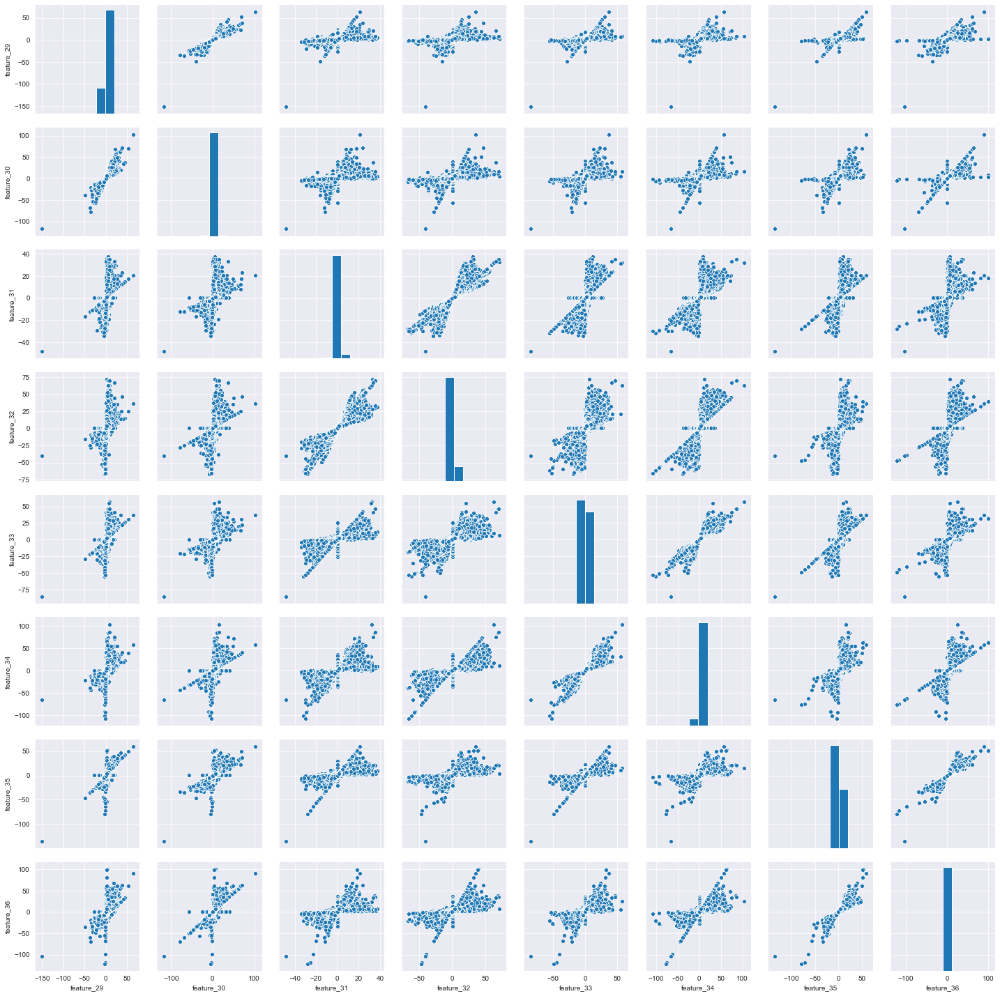

In [76]:
sns.pairplot(df[featstr2[23:31]]);

In [77]:
#things looks almost the same with the other cluster, 
#it also worth mentioning that both of these features clusters are negatively correlated with each other.

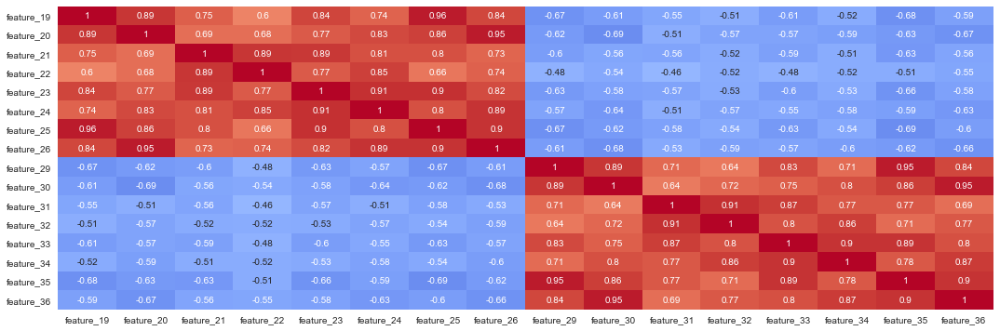

In [78]:
plt.figure(figsize=(18,6)) 
sns.heatmap(df[featstr2[15:31]].corr(),center=0,cmap='coolwarm',annot=True,cbar=False);

In [79]:
#Outliers

In [80]:
#First we take a look at the mean of features.

In [81]:
fig = px.bar(df[featstr].mean(), title='Features mean values')
fig.layout.xaxis.tickangle = 300
fig.update_traces(showlegend = False)
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.show()

In [82]:
fig = px.bar(df[featstr].max(), title='Features Max Values')
fig.layout.xaxis.tickangle = 300
fig.update_traces(showlegend = False)
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.show()

In [83]:
fig = px.bar(df[featstr].min(), title='Features Min Values')
fig.layout.xaxis.tickangle = 300
fig.update_traces(showlegend = False)
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = ''
fig.show()

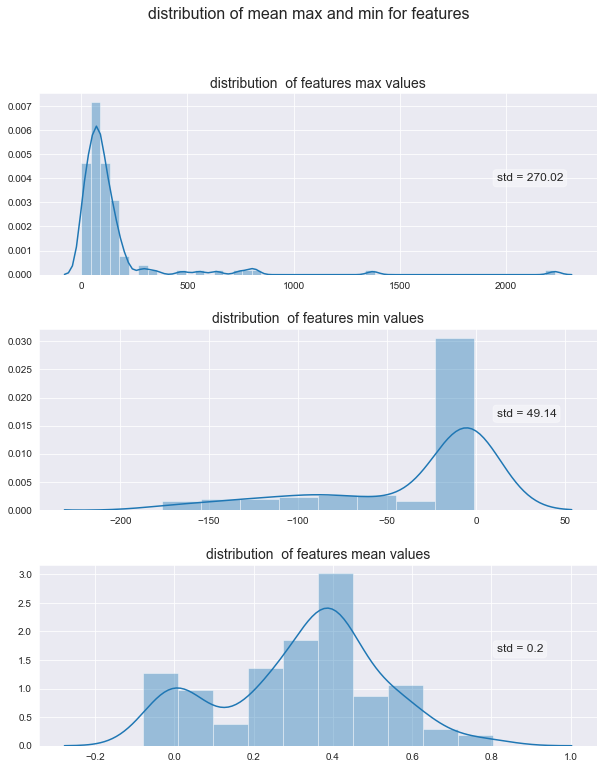

In [84]:
fig, (ax1,ax2,ax3)= plt.subplots(3,1,figsize=(10,12))
plt.subplots_adjust(hspace=.3)
sns.distplot(df[featstr].max(),ax= ax1 )
sns.distplot(df[featstr].min(),ax= ax2)
sns.distplot(df[featstr].mean(),ax= ax3)
fig.suptitle('distribution of mean max and min for features',fontsize=16)
ax1.set_title('distribution  of features max values',fontsize=14)
ax1.text(.82,.56,'std = {}'.format(round(df[featstr].max().std(),2)),transform=ax1.transAxes, verticalalignment='top',bbox=props,fontsize=12)
ax2.set_title('distribution  of features min values',fontsize=14)
ax2.text(.82,.56,'std = {}'.format(round(df[featstr].min().std(),2)),transform=ax2.transAxes, verticalalignment='top',bbox=props,fontsize=12)
ax3.set_title('distribution  of features mean values',fontsize=14)
ax3.text(.82,.56,'std = {}'.format(round(df[featstr].mean().std(),2)),transform=ax3.transAxes, verticalalignment='top',bbox=props,fontsize=12);

In [85]:
#We can see that despite the fact the mean values are not that different from each other 
#the min and max values are very deviated with highly skewed distribution

In [86]:
df[(df.feature_56== df.feature_56.max())|(df.feature_57== df.feature_57.max())|(df.feature_58== df.feature_58.max()) | (df.feature_59== df.feature_59.max())]

,date,weight,resp_1,resp_2,resp_3,resp_4,resp,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_73,feature_74,feature_75,feature_76,feature_77,feature_79,feature_80,feature_81,feature_82,feature_83,feature_85,feature_86,feature_87,feature_88,feature_89,feature_91,feature_92,feature_93,feature_94,feature_95,feature_97,feature_98,feature_99,feature_100,feature_101,feature_103,feature_104,feature_105,feature_106,feature_107,feature_109,feature_110,feature_111,feature_112,feature_113,feature_115,feature_116,feature_117,feature_118,feature_119,feature_120,feature_121,feature_122,feature_123,feature_124,feature_125,feature_126,feature_127,feature_128,feature_129,ts_id,action
235877,38,3.339560,-0.001017,-0.007426,-0.024829,-0.046755,-0.033357,-1,5.399380,5.108447,3.613957,3.282637,1.874917,1.627905,3.537130,2.426174,2.572712,3.605390,-3.484599,-2.825172,2.857596,3.233086,-3.352329,-3.912990,-12.886112,-10.339006,-4.377385,-5.277115,-3.872348,-4.283693,3.506302,4.035474,3.110046,4.478291,3.713556,3.731210,4.706809,4.334348,-3.058521,-3.192860,3.088272,4.539015,-0.136437,3.195502,0.780103,1.167637,-0.327845,0.913224,1.520857,1.316261,1.053037,0.099054,0.855302,1.775148,3.746835,0.985716,388.749815,66.636331,660.351131,800.703641,350.911856,-0.671831,-0.569680,-1.486158,-1.611610,-2.942103,-1.607305,-1.071010,-1.565248,-1.505246,2.665544,-0.095570,1.875405,0.898643,0.415992,1.163417,0.861380,0.671799,0.222680,0.190999,0.681430,0.211753,0.399736,1.027329,0.849244,1.615301,0.705474,-1.423562,-0.041847,-0.107219,-0.006064,-0.310370,-2.582340,-1.338859,0.884709,-0.057046,-1.194013,-1.427599,-0.940190,-0.260405,-0.789533,-1.781693,-2.874468,-0.429607,0.747440,0.427909,-0.787168,-1.908855,-1.880670,-0.350742,-0.874343,-2.260691,-1.953950,6.032958,4.065476,3.634447,1.015100,5.885513,4.415475,8.390346,4.077566,5.459622,2.131100,235877,0
282230,44,10.859674,-0.001306,-0.012651,-0.016530,-0.052089,-0.048993,1,7.414509,9.399608,5.123063,6.146243,4.196547,4.889341,11.098932,11.976443,2.739184,4.887201,6.628507,7.351760,8.330588,11.728739,9.664564,13.641744,5.919429,5.534737,6.929136,9.939452,9.581731,13.009244,-2.449863,-3.702712,-1.050895,-2.082486,-1.886110,-2.196391,-3.542541,-3.657356,5.737075,7.694194,-3.350399,-6.203264,-0.113139,1.447529,-0.254701,7.538714,1.115668,2.226885,3.178381,4.724526,6.178386,1.928744,3.180385,-0.291821,3.230325,2.360054,746.739897,254.094454,816.712092,138.990027,55.821522,-1.349714,-1.129695,-0.094330,-0.107096,-2.041466,-0.597949,-0.441602,-1.366051,-1.314805,16.274911,13.676999,19.838009,-5.815048,-2.006737,-3.691048,-5.506912,0.018003,-2.335785,-0.879096,-2.030294,-2.191662,0.140086,-1.238212,-0.142781,-2.321156,-1.641860,-1.393412,-1.515613,-1.216623,-1.746285,-1.086886,-2.817912,9.008026,2.096552,3.640483,6.876660,-1.182548,3.427998,0.083712,1.071575,3.375455,-2.786946,6.497206,0.910018,1.932831,5.401005,-1.713007,2.378500,-0.578150,0.342619,1.677919,-2.013862,9.998623,10.710449,3.118533,1.845357,6.339649,7.125723,4.243608,2.327895,3.403054,1.688110,282230,0
286937,44,0.219883,0.009060,0.000275,0.008128,0.006852,-0.004134,1,2.464552,3.314074,6.717828,8.427411,5.999205,7.184940,7.984714,8.634280,10.861753,16.884825,16.154589,19.937834,22.595145,31.915412,10.789083,15.700765,14.886054,16.765506,17.146122,24.403795,24.710970,34.675587,-7.076792,-10.

In [87]:
#It can be inferred that the dataset has extreme outliers it also worth mentioning 
#that some of outliers are accompanied with large values from neighbor columns which is a result of high multicollinearity between features¶
#Now we will make a bold move by removing these extreme outliers that are above 99.9% of feature data

In [88]:
n999 = [ np.percentile(df[i],99.9) for i in featstr[1:]]
n001 = [ np.percentile(df[i],.1) for i in featstr[1:]]

In [89]:
for i, j in enumerate(featstr[1:]):
    df = df[df[j] < n999[i]]
    gc.collect()

In [90]:
#Finding the ratio of the data lost in removing the outliers

In [91]:
str(round(((org_len - len(df))/org_len)*100,2))+'%'

'4.01%'

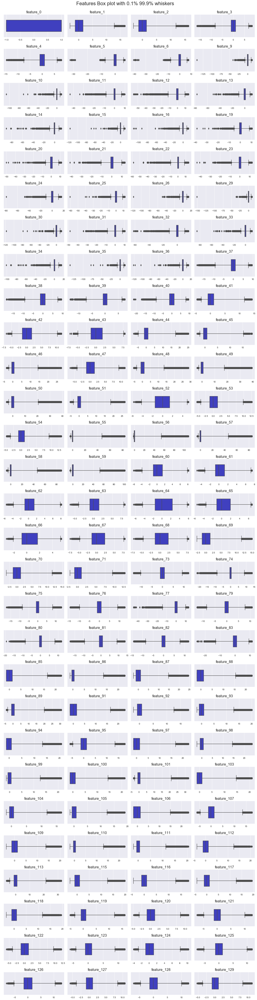

In [92]:
fig = plt.figure(figsize=(20,80))
fig.suptitle('Features Box plot with 0.1% 99.9% whiskers',fontsize=22, y=.89)
grid =  gridspec.GridSpec(29,4,figure=fig,hspace=.5,wspace=.05)
counter = 0
for i in range(29):
    for j in range(4):
        subf = fig.add_subplot(grid[i, j]);
        sns.boxplot(x= df[featstr[counter]],saturation=.5,color= 'blue', ax= subf,width=.5,whis=(.1,99.9));
        subf.set_xlabel('')
        subf.set_title('{}'.format(featstr[counter]),fontsize=16)
        counter += 1
        gc.collect();

In [93]:
#The dataset still has many obvious outliers especially negative values 
#since we only removed positive outliers so features which used to have symmetrical outliers 
#now have some kind of left skewed outliers.
#comparing both of the boxplots (before and after removing positive outliers) 
#we can notice features from feature_3 to feature_40 which used to have symmetrical outliers 
#now changed to have extreme negative outliers after trimming
#Manual outlier trimming to these features

In [94]:
for i,j in zip(featstr[1:][2:34],n001[2:34]):
    df = df[df[i] > j]
    gc.collect();

In [95]:
str(round(((org_len - len(df))/org_len)*100,2))+'%'

'4.89%'

In [96]:
#The kde's and histograms of features after dropping outliers and taking in consideration Resp value

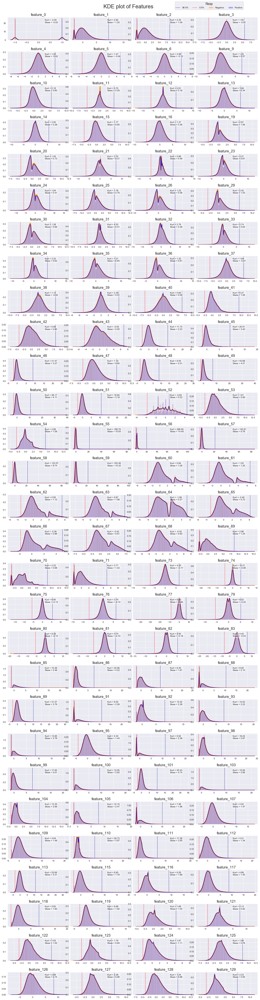

In [97]:
fig = plt.figure(figsize=(20,80))
fig.suptitle('KDE plot of Features',fontsize=24,transform =fig.transFigure, y=.89)
grid =  gridspec.GridSpec(29,4,figure=fig,hspace=.5,wspace=.01)
counter = 0
for i in range(29):
    for j in range(4):
        subf = fig.add_subplot(grid[i, j]);
        sns.distplot(df[df.action==0][featstr[counter]],bins= 100,label='Negative',
                     color='darkorange', kde_kws={'linewidth':4},ax=subf)
        sns.distplot(df[df.action!=0][featstr[counter]],bins= 100,label='Positive',
                     color='blue', kde_kws={'alpha':.9,'linewidth':2},hist_kws={'alpha':.3},ax=subf)
        subf.axvline(np.percentile(df[featstr[counter]],99.5),color= 'darkblue', label='99.5%', linestyle=':',linewidth=2)
        subf.axvline(np.percentile(df[featstr[counter]],.5),color= 'red', label='0.5%', linestyle=':',linewidth=2)
        subf.legend().set_visible(False)
        subf.set_xlabel('')
        subf.set_title('{}'.format(featstr[counter]),fontsize=16)
        kurt=round(df[featstr[counter]].kurt(),2)
        skew=round(df[featstr[counter]].skew(),2)
        subf.text(.6,.92,'Kurt = {:.2f}\nSkew = {:.2f}'.format(kurt ,skew),
         transform=subf.transAxes, verticalalignment='top',bbox=props,fontsize=10)
        counter += 1
        gc.collect();
handles, labels = subf.get_legend_handles_labels()
fig.legend(handles, labels,ncol=4, bbox_to_anchor=(0.86, 0.893),fontsize=10,
           title= 'Resp',title_fontsize=14,bbox_transform =fig.transFigure);

In [98]:
#By Adding Resp value to the features distributions can now see the following:¶
#The histograms of features now have way less outliers and more formal distribution.
#We can also see that some features like 1, 2, 85, 87, 88 and 91 have many negative outliers values.
#Some features like 49, 50, 51, 55, 56, 57, 58, and 59 still have many positive outliers.
#Features distributions are not affected by the resp value.

In [99]:
#Features and resp Correlation

In [100]:
respcorr =  pd.Series([ df.resp.corr(df[i]) for i in featstr],index=featstr)

In [101]:
fig = px.bar(respcorr,color = respcorr, color_continuous_scale=['red','blue'], title= 'Features Correlation with Resp')
fig.layout.xaxis.tickangle = 300
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = 'pearson correlation'
fig.update(layout_coloraxis_showscale=False)
fig.show();

In [102]:
#We can see that features are not really correlated to Resp

In [103]:
#Features and Weight
#Again we make a pandas series of weight correlation with feature 
#but only taking in consideration weights larger than 0

In [104]:
wecorr = pd.Series([df[df.weight != 0].weight.corr(df[df.weight != 0][i]) for i in featstr],index=featstr)

In [105]:
fig = px.bar(wecorr,title= 'Features Correlation with Weight (not including zero weights)')
fig.layout.xaxis.tickangle = 300
fig.layout.xaxis. dtick = 5
fig.layout.xaxis.title = ''
fig.layout.yaxis.title = 'pearson correlation'
fig.update(layout_coloraxis_showscale=False)
fig.update_layout(showlegend=False)
fig.show()

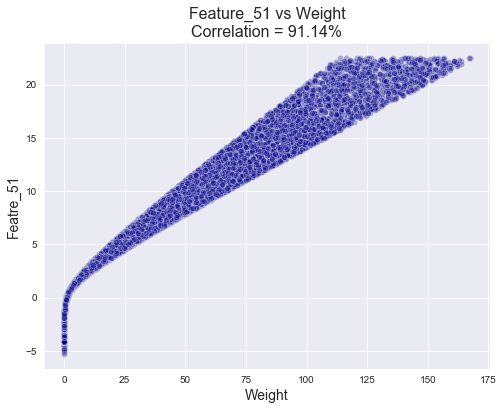

In [106]:
fig = plt.figure(figsize=(8,6))
sns.scatterplot(df[df.weight != 0].weight,df[df.weight != 0].feature_51, color = 'darkblue', alpha=.3)
plt.xlabel('Weight',fontsize=14)
plt.ylabel('Featre_51',fontsize=14)
plt.title('Feature_51 vs Weight\nCorrelation = {}%'.format(round(df[df.weight != 0].weight.corr(df[df.weight != 0].feature_51),4)*100),fontsize=16);

In [107]:
#It seems that weight is highly correlated to feature 51

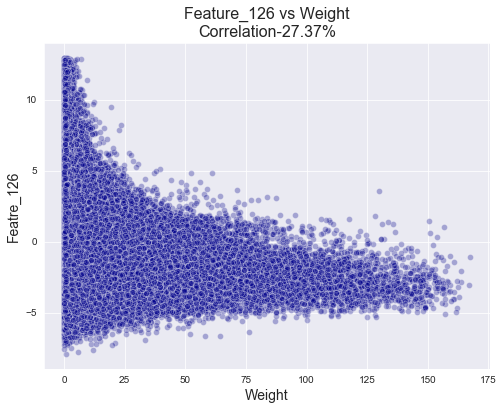

In [108]:
fig = plt.figure(figsize=(8,6))
sns.scatterplot(df[df.weight != 0].weight,df[df.weight != 0].feature_126, color = 'darkblue', alpha=.3)
plt.xlabel('Weight',fontsize=14)
plt.ylabel('Featre_126',fontsize=14)
plt.title('Feature_126 vs Weight\nCorrelation{}%'.format(round(df[df.weight != 0].weight.corr(df[df.weight != 0].feature_126),4)*100),fontsize=16);

In [109]:
#While there is some kind negative correlation between weight and feature 126 the relation seem to be weak

In [110]:
#Feature 0

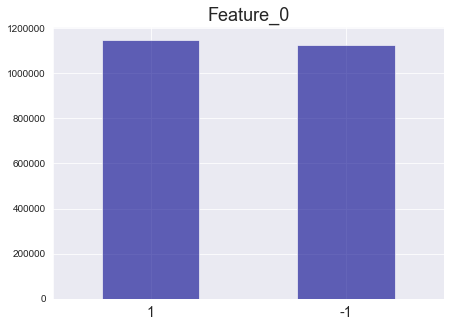

In [111]:
plt.figure(figsize=(7,5)) 
df.feature_0.value_counts().plot.bar(color='darkblue',alpha=.6,width=.5)
plt.title('Feature_0',fontsize=18) 
plt.xticks(rotation=0,fontsize=14);

In [112]:
#Feature_0 seem to be some kind of binary feature